# **Binary Image Classification Using the Vision Transformer Model**

In this notebook, the [Vision Transformer (ViT)](https://huggingface.co/docs/transformers/model_doc/vit) model is fine-tuned for binary image classification using the [Cats Vs Dogs](https://www.microsoft.com/en-us/download/details.aspx?id=54765) dataset. This dataset contains 25,000 RGB images of cats and dogs (23,262 excluding corrupted images) and is loaded using TensorFlow Datasets. Since the dataset only includes a training set, it is split into 80% for training and 20% for testing, ensuring a balanced representation of both classes, cats and dogs, in each subset. Additionally, the trained model is also evaluated using the [Oxford-IIIT Pet](https://www.robots.ox.ac.uk/%7Evgg/data/pets/) dataset, which contains RGB images of dogs and cats distributed across 37 classes, but for this purpose, only the two superclasses (species), ``Cats`` and ``Dogs``, are considered.

The ViT model is a pioneer in applying transformer networks to computer vision, with an architecture similar to [BERT](https://huggingface.co/docs/transformers/model_doc/bert). This notebook specifically fine-tunes the [``google/vit-base-patch16-224``](https://huggingface.co/google/vit-base-patch16-224) version, which was pre-trained on [ImageNet21K](https://github.com/Alibaba-MIIL/ImageNet21K) at a resolution of 224x224 and fine-tuned on [ImageNet 2012](https://www.image-net.org/challenges/LSVRC/2012/). The images are presented to the model as a sequence of fixed-size patches of 16x16 pixels, which are encoded by an input embedding; these 16x16 patches are analogous to words in natural language processing. This approach enables ViT models to deliver outstanding performance compared to leading convolutional neural networks while using fewer computational resources.



## **Imports**

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
from transformers import AutoImageProcessor, TFAutoModelForImageClassification
from transformers import create_optimizer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from google.colab import drive

## **Parameters**

In [3]:
drive.mount("/content/drive/")

Mounted at /content/drive/


In [2]:
epochs = 5
batch_size = 128
buffer_size = 1024
AUTOTUNE = tf.data.AUTOTUNE
SEED = 123
# In this case, the base version of ViT is more than sufficient given that it is a binary classification task
model_name = "google/vit-base-patch16-224"

## **Prepare the dataset for training**

### **Load the dataset**

In [20]:
(train_dataset, test_dataset), info = tfds.load(
    "cats_vs_dogs",
    split=["train[:80%]", "train[80%:]"],
    as_supervised=True,
    with_info=True
)

info

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/incomplete.N983TG_4.0.1/cats_vs_dogs-train.tfrecord*...:   0%…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir=PosixGPath('/tmp/tmpjyaysg9ztfds'),
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    

In [21]:
len(train_dataset), len(test_dataset)

(18610, 4652)

In [4]:
num_classes = info.features["label"].num_classes
class_names = info.features["label"].names
class_names = [name.capitalize() for name in class_names]

print("Number of classes:", num_classes)
print("Class names:", class_names)

Number of classes: 2
Class names: ['Cat', 'Dog'] 



### **Preprocessing and data augmentation**

To mitigate overfitting, it is crucial to employ data augmentation techniques, especially considering that the training dataset is relatively small. Data augmentation enhances the model's generalization capability for image classification. For this purpose, TensorFlow layers such as [``RandomFlip``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomFlip), [``RandomTranslation``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomTranslation), [``RandomRotation``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomRotation), and [``RandomZoom``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomZoom) are used. These layers are applied exclusively to the training dataset during preprocessing, controlled by setting the parameter ``training=True``.

Regarding image preprocessing, although the generic image processor class from Hugging Face, [AutoImageProcessor](https://huggingface.co/docs/transformers/model_doc/auto#transformers.AutoImageProcessor), could be used, it is not compatible with TensorFlow graphs, which could slow down the training process. Therefore, TensorFlow layers are employed for preprocessing, allowing the processing to occur in parallel with training, thereby significantly speeding up the training time. Since image sizes vary, the images are first resized to ensure compatibility with the model and batch data augmentation, using the [``tf.image.resize``](https://www.tensorflow.org/api_docs/python/tf/image/resize) function. Next, the [``Rescaling``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Rescaling) layer normalizes the images to the range of ``[-1, 1]``, and the [``Permute``](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Permute) layer rearranges image channels into the second dimension, ensuring compatibility with the PyTorch model format. These two layers operate independently of the ``training`` parameter, so they are applied to both the training and testing datasets.

In [6]:
image_processor = AutoImageProcessor.from_pretrained(model_name)
image_processor

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


ViTImageProcessor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [6]:
original_size = info.features["image"].shape
new_size = (image_processor.size["height"], image_processor.size["width"], 3)

original_size, new_size

((None, None, 3), (224, 224, 3))

In [7]:
def function_data_augmentation(input_shape):
  return tf.keras.Sequential([
      tf.keras.Input(shape=input_shape),
      tf.keras.layers.RandomFlip("horizontal"),
      tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2, fill_mode="nearest"),
      tf.keras.layers.RandomRotation(0.1, fill_mode="nearest"),
      tf.keras.layers.RandomZoom(0.2, fill_mode="nearest"),
      tf.keras.layers.Rescaling(1/127.5, offset=-1),
      tf.keras.layers.Permute((3, 1, 2))
  ], name="data_augmentation")

In [8]:
tf.keras.backend.clear_session() #Clearing Keras memory

data_augmentation = function_data_augmentation(new_size)
data_augmentation.summary()

Model: "data_augmentation"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip (RandomFlip)    (None, 224, 224, 3)       0         
                                                                 
 random_translation (Random  (None, 224, 224, 3)       0         
 Translation)                                                    
                                                                 
 random_rotation (RandomRot  (None, 224, 224, 3)       0         
 ation)                                                          
                                                                 
 random_zoom (RandomZoom)    (None, 224, 224, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 permute (Permute)           (None, 3, 224, 224) 

In [9]:
def prepare_dataset(dataset, training=True):
  dataset = dataset.map(
      map_func=lambda x, y: (tf.image.resize(x, size=(new_size[0], new_size[1])), y),
      num_parallel_calls=AUTOTUNE
  )

  if training:
    dataset = dataset.shuffle(buffer_size, seed=SEED)

  dataset = (
      dataset.
      batch(batch_size).
      map(lambda x, y : (data_augmentation(x, training=training), y), num_parallel_calls=AUTOTUNE).
      prefetch(AUTOTUNE)
  )

  return dataset

In [10]:
train_dataset = prepare_dataset(train_dataset)
test_dataset = prepare_dataset(test_dataset, training=False)

In [11]:
# Take a batch from the training dataset
for images, labels in train_dataset.take(1):
  print(images.shape, labels.shape)

images.numpy().min(), images.numpy().max()

(128, 3, 224, 224) (128,)


(-1.0, 1.0)

**Function to display and save images**

In [12]:
def show_images(images, labels, predictions=None, num_examples=25, random=True,
                cmap=None, axis="off", save=False, path=""):

  # Denormalize the images
  images = (tf.transpose(images, perm=[0, 2, 3, 1]) + 1) / 2

  n = int(np.sqrt(num_examples))
  indices = np.arange(len(images))
  if random:
    np.random.shuffle(indices)

  fig, axes = plt.subplots(n, n, figsize=(1.75*n, 1.75*n))

  for i, ax in enumerate(axes.flat):
    ax.imshow(images[indices[i]], cmap=cmap)

    if predictions is not None:
      color = "#00008B" if labels[indices[i]] == predictions[indices[i]] else "red"

      ax.text(
          x=0.5, y=1.101, s=f"Label: {class_names[labels[indices[i]]]}", color=color, fontsize=6.9,
          fontweight="bold", ha="center", va="bottom", transform=ax.transAxes
      )
      ax.text(
          x=0.5, y=1, s=f"Pred: {class_names[predictions[indices[i]]]}", color=color, fontsize=6.9,
          fontweight="bold", ha="center", va="bottom", transform=ax.transAxes
      )

    else:
      ax.text(
          x=0.5, y=1, s=f"Label: {class_names[labels[indices[i]]]}", fontsize=6.9,
          fontweight="bold", ha="center", va="bottom", transform=ax.transAxes
      )

    ax.axis(axis)

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path)

  plt.show()

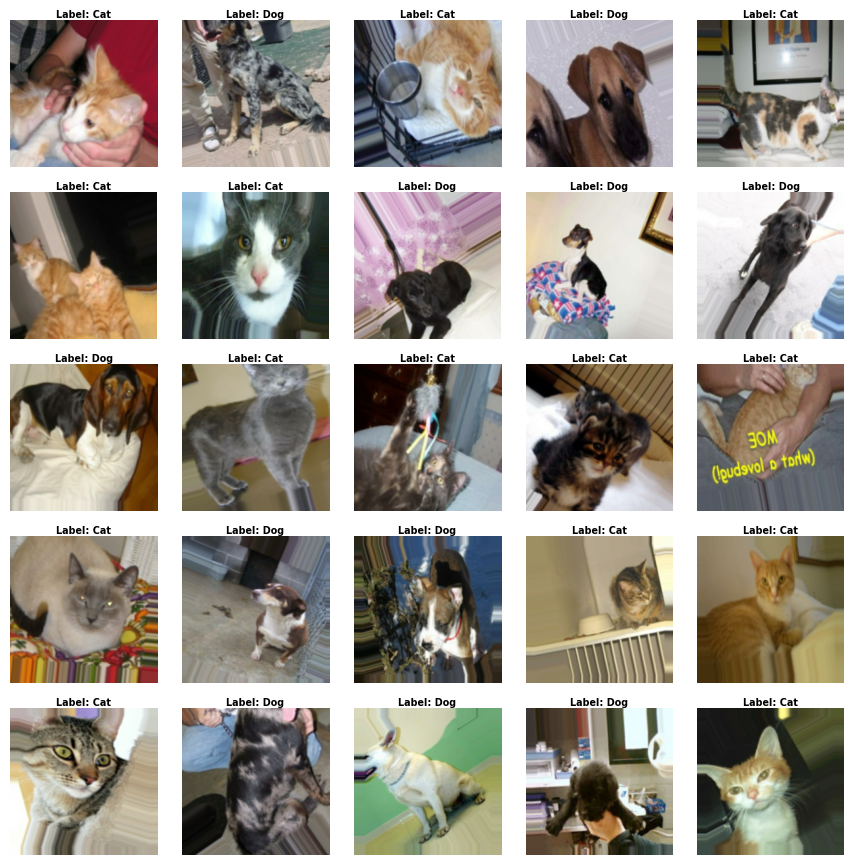

In [13]:
# Some images from the training dataset after data augmentation
show_images(images, labels, random=False)

## **Model building and training**

To speed up training time, the Google Colab TPU is utilized. The model is loaded using the generic [`TFAutoModelForImageClassification`](https://huggingface.co/docs/transformers/model_doc/auto#transformers.AutoModelForImageClassification) class, which allows loading a ViT model available on Hugging Face by simply specifying its name.

In [14]:
# TPU setup

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu="local")
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.TPUStrategy(tpu)
  print("TPU initialized:")
  print("All devices: ", tf.config.list_logical_devices("TPU"))
except (ValueError, tf.errors.InvalidArgumentError, tf.errors.NotFoundError) as error:
  print(f"Error: {error}")


TPU initialized:
All devices:  [LogicalDevice(name='/device:TPU:0', device_type='TPU'), LogicalDevice(name='/device:TPU:1', device_type='TPU'), LogicalDevice(name='/device:TPU:2', device_type='TPU'), LogicalDevice(name='/device:TPU:3', device_type='TPU'), LogicalDevice(name='/device:TPU:4', device_type='TPU'), LogicalDevice(name='/device:TPU:5', device_type='TPU'), LogicalDevice(name='/device:TPU:6', device_type='TPU'), LogicalDevice(name='/device:TPU:7', device_type='TPU')]


In [18]:
tf.keras.backend.clear_session()

with strategy.scope():
  model = TFAutoModelForImageClassification.from_pretrained(
      model_name,
      num_labels=num_classes,
      ignore_mismatched_sizes=True
  )

  optimizer, lr_schedule = create_optimizer(
      init_lr=3e-5,
      num_train_steps=len(train_dataset)*epochs,
      weight_decay_rate=0.01,
      num_warmup_steps=0
  )
  model.compile(
      optimizer=optimizer,
      loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
      metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy")],
      steps_per_execution=50
  )

model.summary()

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFViTForImageClassification: ['classifier.bias', 'classifier.weight']
- This IS expected if you are initializing TFViTForImageClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFViTForImageClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFViTForImageClassification were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTForImageClassification for predictions without further training.
Some weights of TFViTForImageClassification were not initialized from the model checkpoint are newly initialize

Model: "tf_vi_t_for_image_classification"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vit (TFViTMainLayer)        multiple                  85798656  
                                                                 
 classifier (Dense)          multiple                  1538      
                                                                 
Total params: 85800194 (327.30 MB)
Trainable params: 85800194 (327.30 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [19]:
# Callback to stop training early if validation accuracy does not improve for 1 epoch
patience = 1
callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=patience,
    restore_best_weights=True
)

In [20]:
# Train the model
history = model.fit(train_dataset, epochs=epochs, validation_data=test_dataset, callbacks=[callback])

Epoch 1/5
146/146 [==============================] - 254s 2s/step - loss: 0.0659 - accuracy: 0.9766 - val_loss: 0.0143 - val_accuracy: 0.9955
Epoch 2/5
146/146 [==============================] - 31s 215ms/step - loss: 0.0139 - accuracy: 0.9955 - val_loss: 0.0129 - val_accuracy: 0.9959
Epoch 3/5
146/146 [==============================] - 32s 223ms/step - loss: 0.0109 - accuracy: 0.9963 - val_loss: 0.0104 - val_accuracy: 0.9972
Epoch 4/5
146/146 [==============================] - 41s 282ms/step - loss: 0.0089 - accuracy: 0.9969 - val_loss: 0.0147 - val_accuracy: 0.9948


**Save the model**

In [33]:
trained_model_path = "/content/drive/MyDrive/models/BinaryImageClassification_ViT_CatsVsDogs"
model.save_pretrained(trained_model_path)

## **Model Evaluation**

In [21]:
print(model.evaluate(train_dataset, verbose=0))
print(model.evaluate(test_dataset, verbose=0))

[0.008391913957893848, 0.9974207282066345]
[0.010435217060148716, 0.9972054958343506]


### **Graphs of the metrics**

In [22]:
# Library needed to convert Plotly interactive graphics into images
!pip install kaleido -q

In [23]:
# Function to plot the metrics
def plot_metrics(history=history.history, metric="loss", renderer=None, with_patience=True):
  epochs = len(history["loss"])
  losses = history[metric]
  val_losses = history[f"val_{metric}"]
  list_epochs = np.arange(1, epochs+1)
  metric = " ".join([w.capitalize() for w in metric.split("_")])

  fig=go.Figure()
  fig.add_trace(go.Scatter(x=list_epochs, y=losses, name=metric, line=dict(color="blue", width=2)))
  fig.add_trace(go.Scatter(x=list_epochs, y=val_losses, name=f"Val {metric}", line=dict(color="#FF6600", width=2)))

  last_epoch = epochs-patience if with_patience else epochs
  fig.add_vline(
      x=last_epoch, line=dict(color="red", width=2, dash="dash"),
      annotation_text="End of Training", annotation_position="top left",
      annotation=dict(font_size=12, font_color="red")
  )

  fig.update_xaxes(title_text="Epoch")
  fig.update_yaxes(title_text=metric)
  fig.update_layout(title=f"Evolution of {metric} across Epochs",
                    title_font=dict(size=20),
                    title_x=0.5,
                    height=500,
                    width=1200)

  fig.show(renderer)

In [24]:
# Interactive graphic
plot_metrics(metric="accuracy")
plot_metrics()

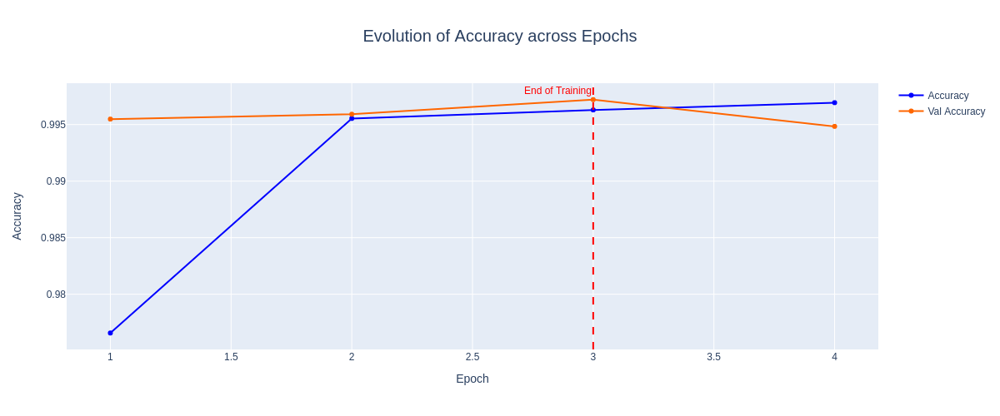

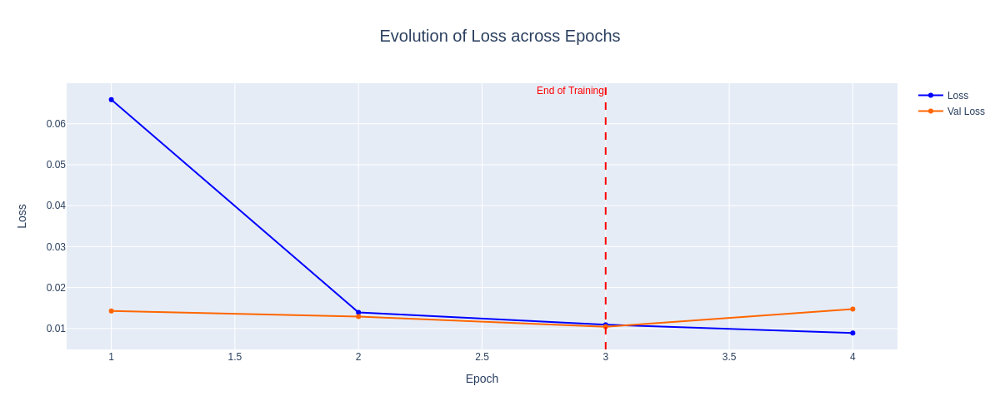

In [25]:
# Static image for GitHub
plot_metrics(metric="accuracy", renderer="png")
plot_metrics(renderer="png")

### **Confusion Matrix**

In [26]:
# Extract labels from the test dataset
labels_test = test_dataset.unbatch().map(lambda image, label: label)
labels_test = np.array(list(labels_test.as_numpy_iterator()))

# Generate predictions with the trained model
labels_test_pred = model.predict(test_dataset, verbose=0).logits
labels_test_pred = np.argmax(labels_test_pred, axis=-1)

# Consolidating the accuracy of the test dataset
print("Accuracy:", np.mean(labels_test == labels_test_pred))
print(f"F1 Score: {f1_score(labels_test, labels_test_pred)}")

Accuracy: 0.9972055030094583
F1 Score: 0.9972614282704866


Frequency per Label: [2280 2372] 



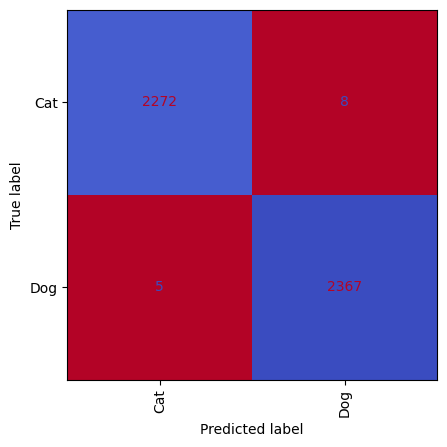

In [27]:
print("Frequency per Label:", np.unique(labels_test, return_counts=True)[1], "\n")
cm = confusion_matrix(labels_test, labels_test_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=class_names)
cmd.plot(colorbar=False, cmap="coolwarm_r", xticks_rotation="vertical");

It can be seen that the test dataset is approximately balanced, with the ``Dog`` class having only 92 more records. Additionally, the model generalizes quite well, classifying the ``Dog`` and ``Cat`` classes almost equally despite this slight data imbalance.

### **Evaluation on the Oxford-IIIT Pet Dataset**

In [28]:
(train_dataset_oxford, test_dataset_oxford), info = tfds.load(
    "oxford_iiit_pet",
    split=["train", "test"],
    as_supervised=False,
    with_info=True
)

info

tfds.core.DatasetInfo(
    name='oxford_iiit_pet',
    full_name='oxford_iiit_pet/3.2.0',
    description="""
    The Oxford-IIIT pet dataset is a 37 category pet image dataset with roughly 200
    images for each class. The images have large variations in scale, pose and
    lighting. All images have an associated ground truth annotation of breed.
    """,
    homepage='http://www.robots.ox.ac.uk/~vgg/data/pets/',
    data_dir='/root/tensorflow_datasets/oxford_iiit_pet/3.2.0',
    file_format=tfrecord,
    download_size=773.52 MiB,
    dataset_size=774.69 MiB,
    features=FeaturesDict({
        'file_name': Text(shape=(), dtype=string),
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=37),
        'segmentation_mask': Image(shape=(None, None, 1), dtype=uint8),
        'species': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    spl

In [29]:
def preprocessing_oxford(dic):
  image = tf.image.resize(dic["image"], size=new_size[:-1])
  image = tf.transpose(image, perm=[2, 0, 1])
  image = (image / 127.5) - 1
  label = dic["species"]
  return image, label

In [30]:
train_dataset_oxford = (
    train_dataset_oxford.
    map(preprocessing_oxford, num_parallel_calls=AUTOTUNE).
    batch(batch_size)
)

test_dataset_oxford = (
    test_dataset_oxford.
    map(preprocessing_oxford, num_parallel_calls=AUTOTUNE).
    batch(batch_size)
)

In [31]:
print(model.evaluate(train_dataset_oxford, verbose=0))
print(model.evaluate(test_dataset_oxford, verbose=0))

[0.019952112808823586, 0.9942934513092041]
[0.02587038092315197, 0.9934586882591248]


The model's generalization capability is notably excellent, even with datasets that were not used during its fine-tuning, such as the Oxford-IIIT Pet dataset, which also contains images of dogs and cats, achieving accuracies above **99%**.

## **Predictions with the trained model**

### **Test dataset**

In [34]:
# Extract images from the test dataset
images_test = test_dataset.unbatch().map(lambda image, label: image)
images_test = np.array(list(images_test.as_numpy_iterator()))

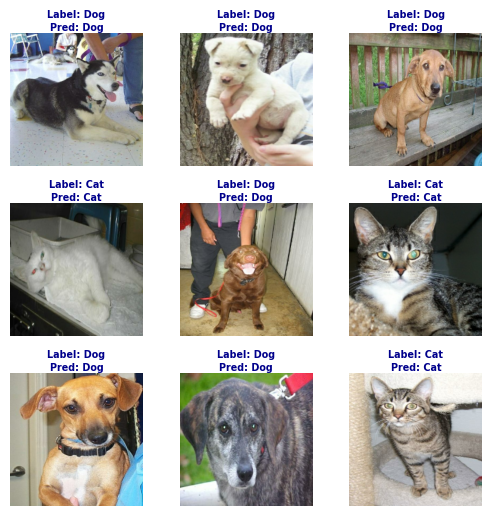

In [36]:
show_images(images_test, labels_test, labels_test_pred, num_examples=9)

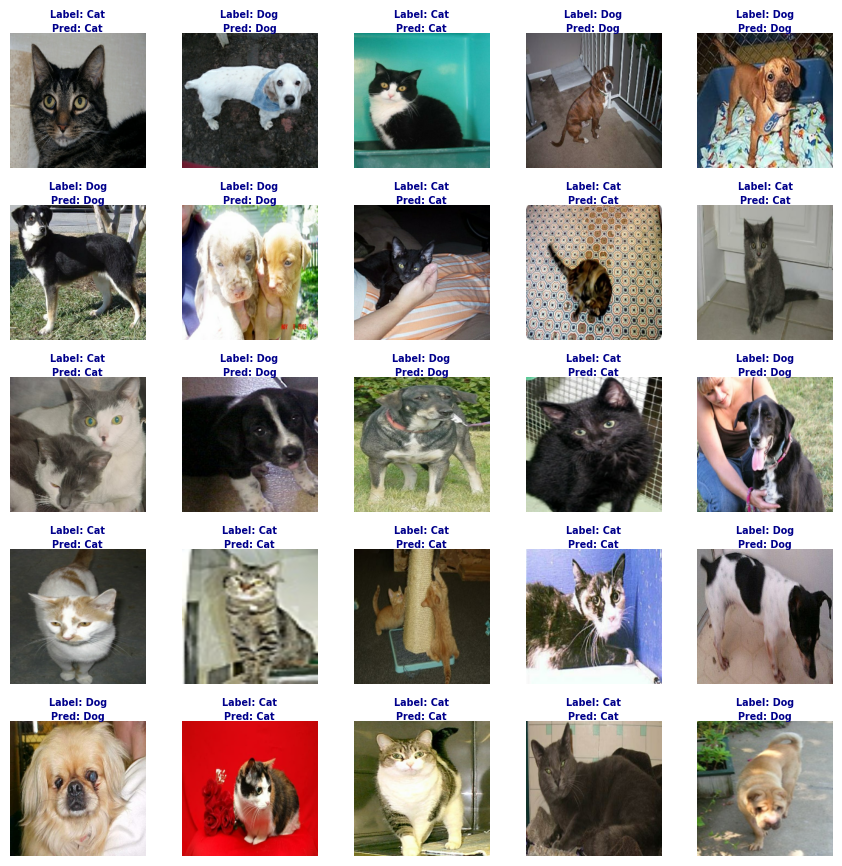

In [41]:
show_images(
    images_test, labels_test, labels_test_pred,
    save=True, path="BinaryImageClassification_ViT_CatsVsDogs.png"
)

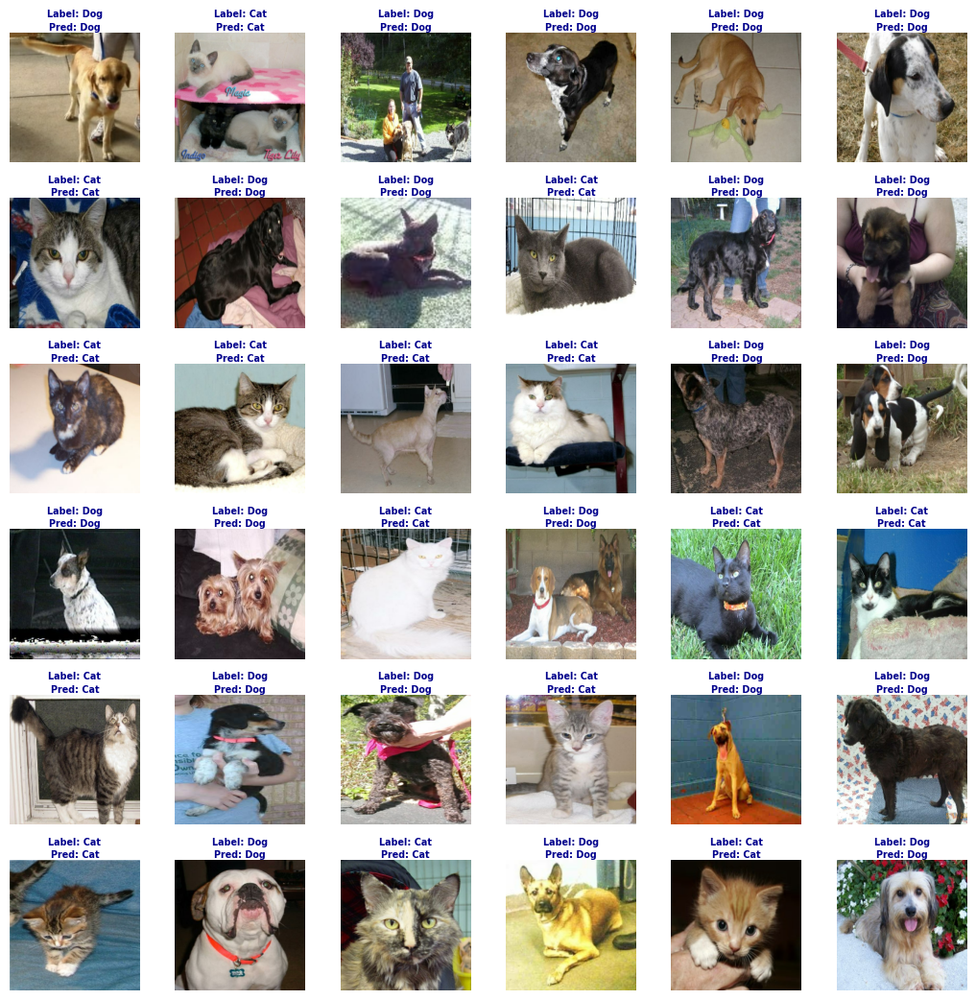

In [39]:
show_images(images_test, labels_test, labels_test_pred, num_examples=36, random=False)

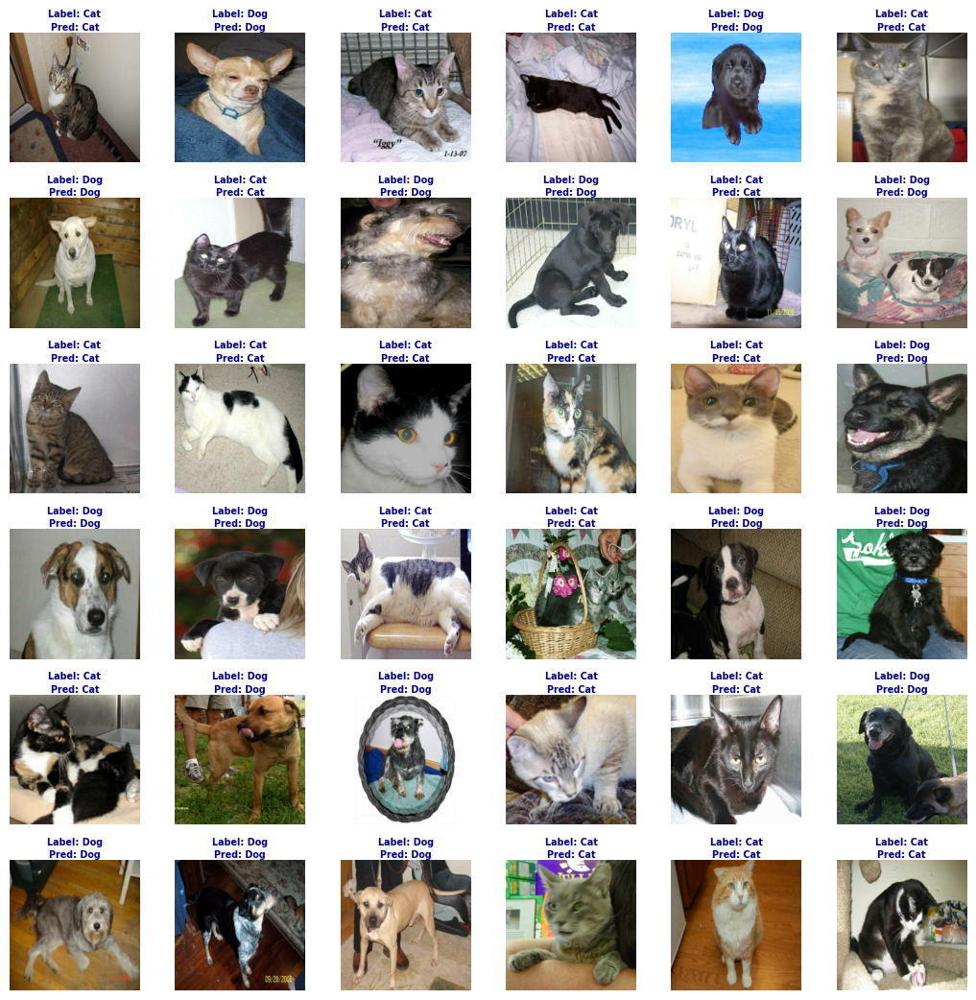

In [40]:
show_images(images_test, labels_test, labels_test_pred, num_examples=36)

### **Oxford-IIIT Pet Test Dataset**

In [42]:
# Extract images from the test dataset
images_test_oxford = test_dataset_oxford.unbatch().map(lambda image, label: image)
images_test_oxford = np.array(list(images_test_oxford.as_numpy_iterator()))

# Extract labels from the test dataset
labels_test_oxford = test_dataset_oxford.unbatch().map(lambda image, label: label)
labels_test_oxford = np.array(list(labels_test_oxford.as_numpy_iterator()))

# Generate predictions with the trained model
labels_test_pred_oxford = model.predict(test_dataset_oxford, verbose=0).logits
labels_test_pred_oxford = np.argmax(labels_test_pred_oxford, axis=-1)

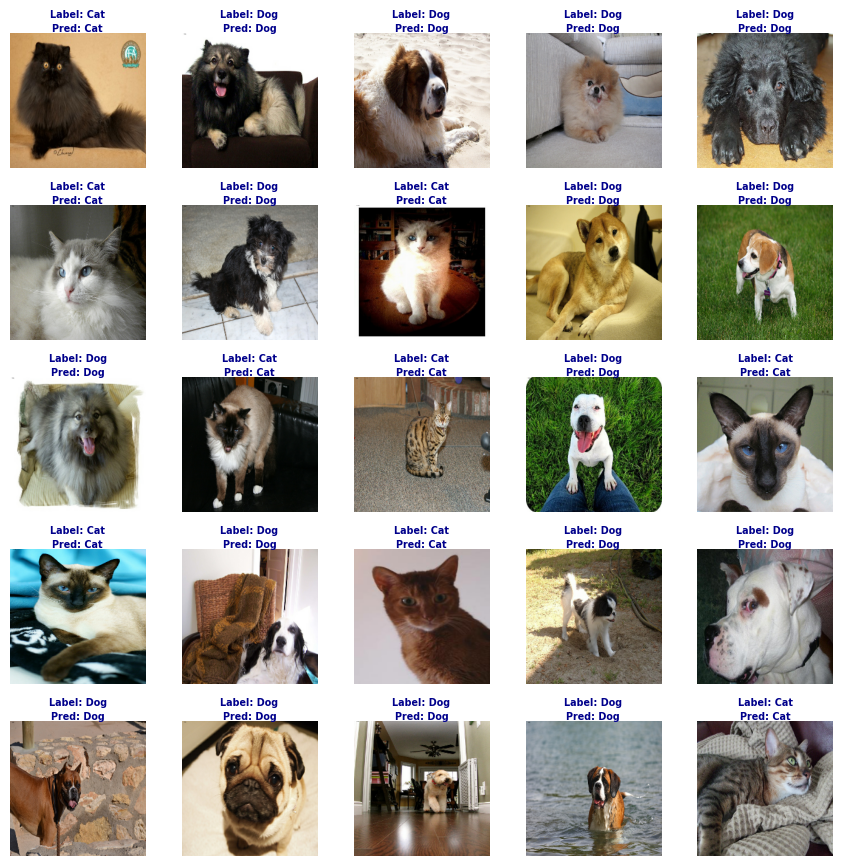

In [47]:
show_images(images_test_oxford, labels_test_oxford, labels_test_pred_oxford)

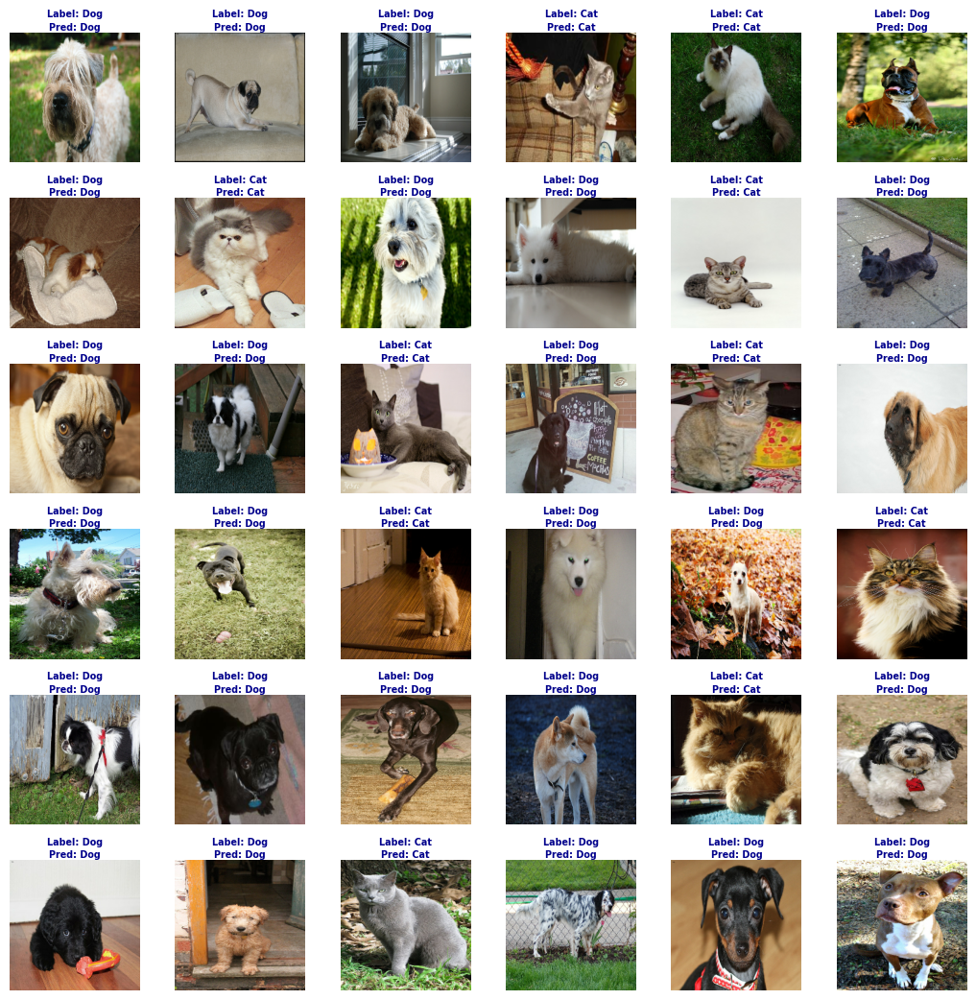

In [46]:
show_images(images_test_oxford, labels_test_oxford, labels_test_pred_oxford, num_examples=36)

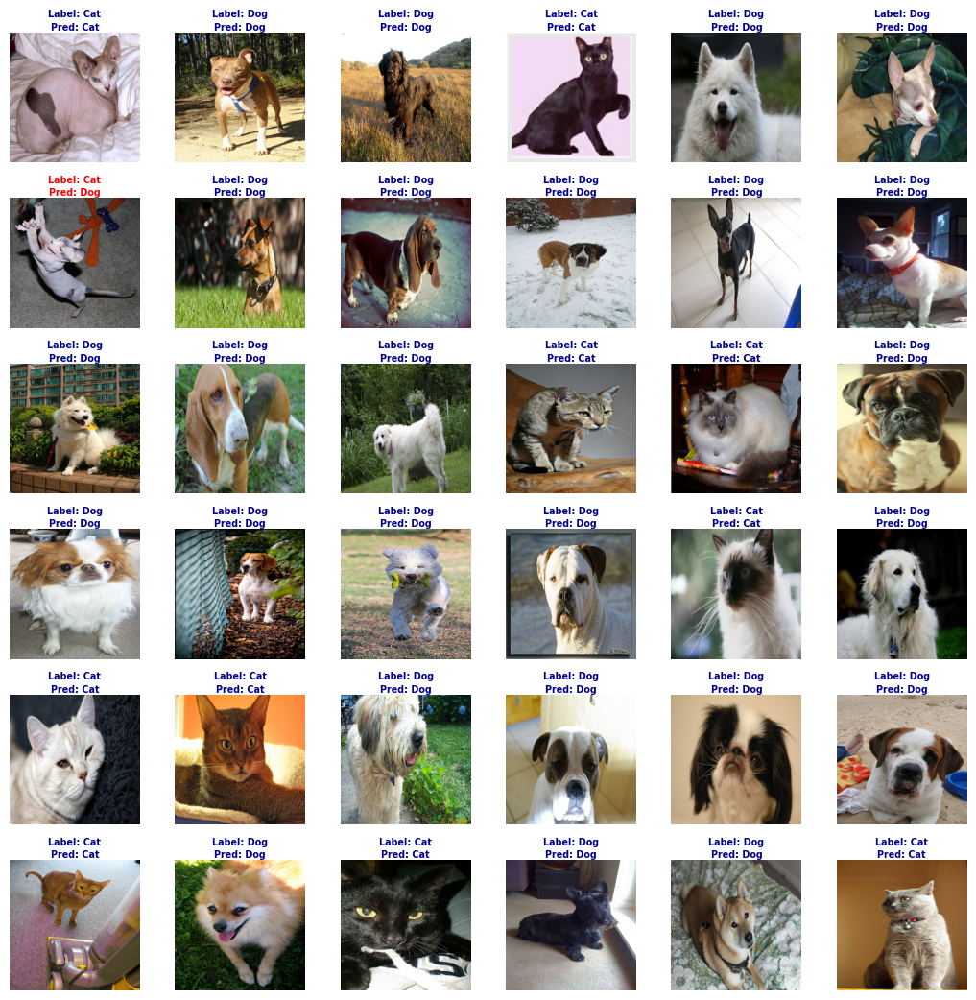

In [56]:
# The image below shows an incorrect prediction
show_images(images_test_oxford, labels_test_oxford, labels_test_pred_oxford, num_examples=36)

### **Other images**

In [9]:
# Load the trained model
tf.keras.backend.clear_session()
model = TFAutoModelForImageClassification.from_pretrained(trained_model_path)

All model checkpoint layers were used when initializing TFViTForImageClassification.

All the layers of TFViTForImageClassification were initialized from the model checkpoint at /content/drive/MyDrive/models/BinaryImageClassification_ViT_CatsVsDogs.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTForImageClassification for predictions without further training.


In [10]:
# Function to predict images from the internet
def predict_image(url, label=None):
  path = tf.keras.utils.get_file(origin=url)
  image = tf.keras.utils.load_img(path)
  inputs = image_processor(image, return_tensors="tf")

  pred = model(**inputs).logits
  pred = np.argmax(pred, axis=-1)
  pred = class_names[pred[0]]

  if label is not None:
    color = "#00008B" if label == pred else "red"
    plt.title(f"Label: {label}\nPred: {pred}", color=color)
  else:
    plt.title(f"Pred: {pred}")

  plt.imshow(image)
  plt.axis("off")
  plt.tight_layout();

80909/80909 [==============================] - 0s 0us/step


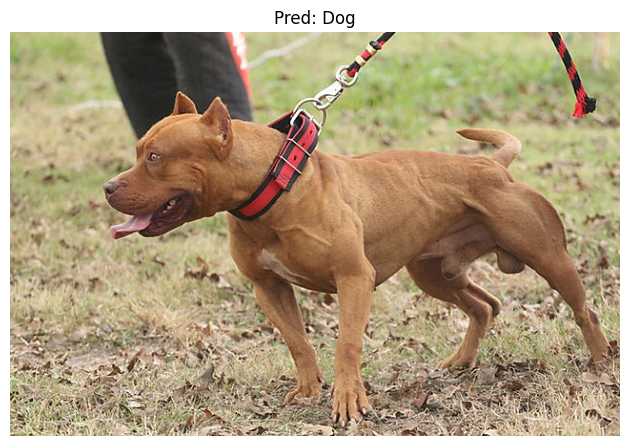

In [11]:
url = "https://static.wixstatic.com/media/db516d_24b96edddfeb4296baf83c7e8fa59010~mv2.jpg/v1/fill/w_640,h_424,al_c,q_80,usm_1.20_1.00_0.01,enc_auto/db516d_24b96edddfeb4296baf83c7e8fa59010~mv2.jpg"
#label = "Dog"

predict_image(url)

47625/47625 [==============================] - 0s 2us/step


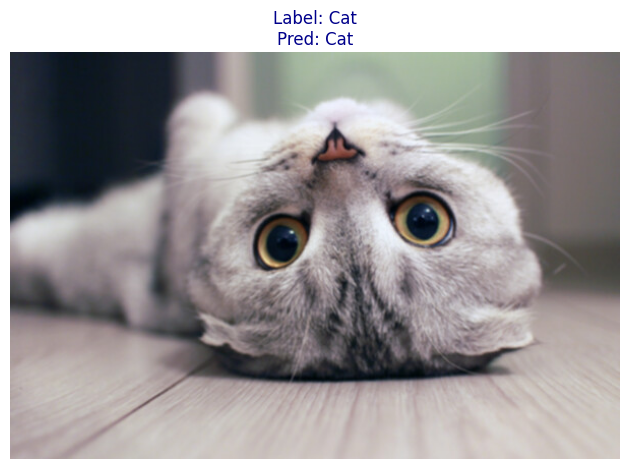

In [12]:
url = "https://www.mundopsicologos.com/pro/psicologos/articles/df/75/226185/44837/tener-un-gato.jpg"
label = "Cat"

predict_image(url, label)

190142/190142 [==============================] - 0s 0us/step


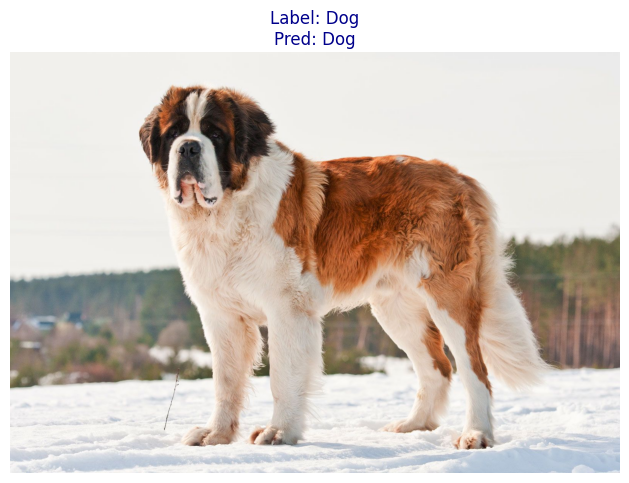

In [13]:
url = "https://cdn.britannica.com/66/235666-050-751046D6/Saint-bernard-dog-st-bernard-standing-snow.jpg"
label = "Dog"

predict_image(url, label)

17106/17106 [==============================] - 0s 4us/step


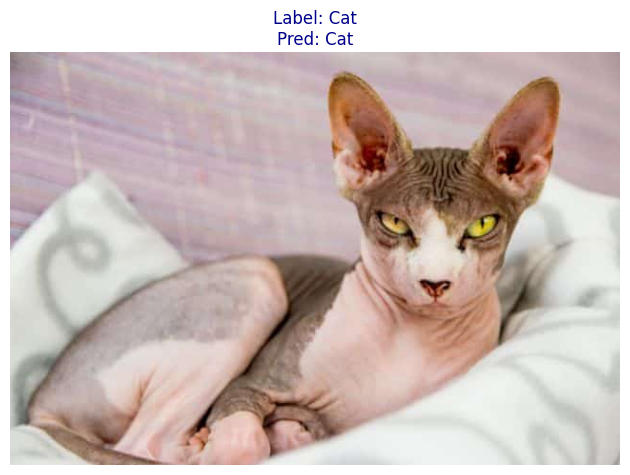

In [14]:
url = "https://cdn.nubika.es/wp-content/uploads/2024/05/29080041/cuidados-del-gato-sphynx.jpg"
label = "Cat"

predict_image(url, label)

53526/53526 [==============================] - 0s 0us/step


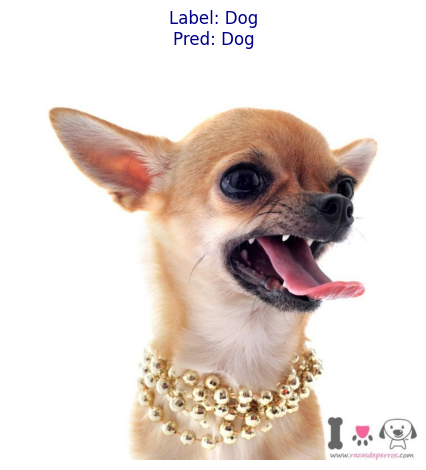

In [15]:
url = "https://i.pinimg.com/736x/14/8f/db/148fdb0b7314c43bbec850a55c3c1217.jpg"
label = "Dog"

predict_image(url, label)

134264/134264 [==============================] - 0s 0us/step


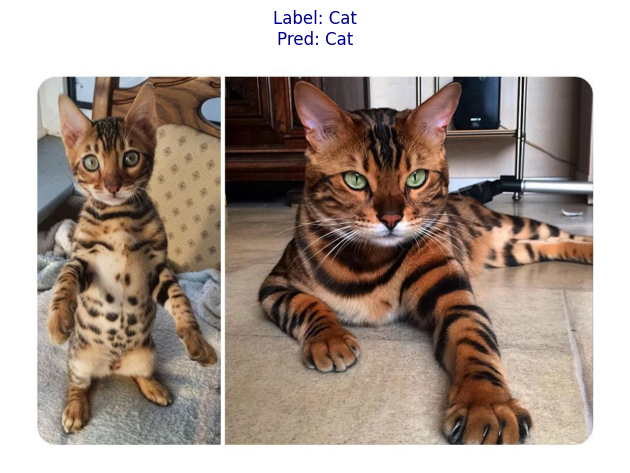

In [16]:
url = "https://i.redd.it/0kchghpaigpa1.jpg"
label = "Cat"

predict_image(url, label)

30347/30347 [==============================] - 0s 0us/step


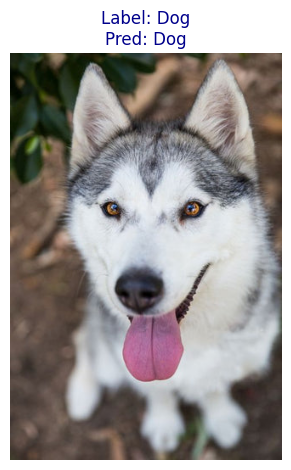

In [17]:
url = "https://cdn.shopify.com/s/files/1/2342/0893/files/gettyimages-464163411_480x480.jpg?v=1655879902"
label = "Dog"

predict_image(url, label)

59510/59510 [==============================] - 0s 0us/step


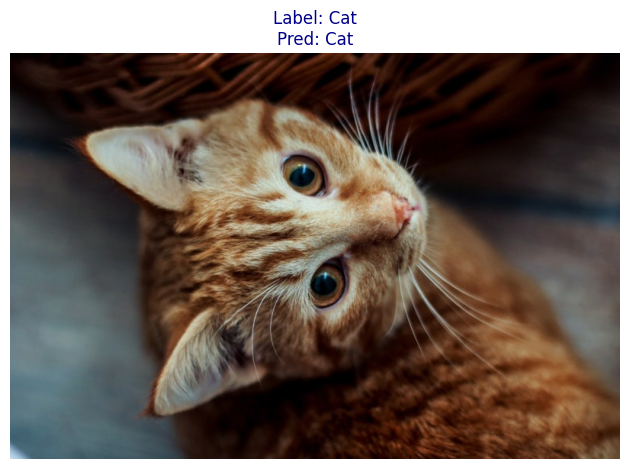

In [18]:
url = "https://mblogthumb-phinf.pstatic.net/MjAyMTAxMTVfNTAg/MDAxNjEwNjc4ODcxNjU2.A7-fkLkNB1_kGgPTttfLWlUh__WCycaBLwF26pCqGcYg._GSVkR0SxPEfBrnFkt0EZfBKoGlMfVuf3hu-0stRBDMg.JPEG.h-animalcare/cat-3ELB97J.jpg?type=w800"
label = "Cat"

predict_image(url, label)

4718/4718 [==============================] - 0s 0us/step


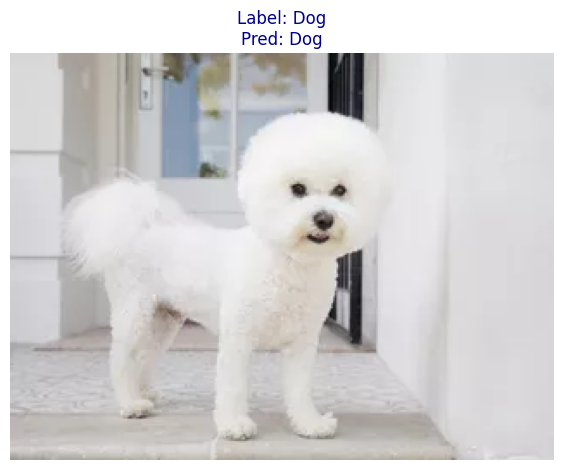

In [19]:
url = "https://www.thesprucepets.com/thmb/MExyca16zL-y8MH2N_5ndVXAk-s=/315x236/filters:no_upscale():strip_icc():format(webp)/white-dog-breeds-4846529-hero-4bf084c93c5b45a292e30559bb7e50e8.jpg"
label = "Dog"

predict_image(url, label)

**Conclusion:** The model achieved an accuracy of **99.74%** on the training dataset and **99.72%** on the test dataset, with an F1 score of **99.73%**. These results demonstrate that the model is highly effective at classifying images of dogs and cats, despite only using the base ViT model for fine-tuning, highlighting the robustness of these models. Moreover, the balance between precision and recall is outstanding, as the F1 score and accuracy in the evaluation are nearly identical. No overfitting was observed, thanks to data augmentation and the use of early stopping callbacks. Had the training continued for more epochs, the accuracy on the training set would likely have reached 100%, while the accuracy on the test set might have begun to decline or stabilize. It is also important to note that the model exhibits excellent generalization capability, even with datasets not included in the fine-tuning process, such as the Oxford-IIIT Pet dataset, where it achieved accuracies above **99%** in both the training and test sets.